# Image Processing Different Concept 

Here, we will go through some basic but interesting concept of Image Processing. We will see how each paramenter effect our image and what is the important of each function i.e functionality of each parameter.

1.  Blending of Image or Pasting Image.
2.   Image Thresholding.


3.   Blurring and Smoothing.
4.   Morphological Operator (Open, Close etc).


5.   Gradients(for detecting edges).
6.   Histogram Equalization.







In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
plt.style.use("fivethirtyeight")

## Blending Different Size Image

In [2]:
img1 = cv2.imread("../input/image-processing/images.jpg")
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img1.shape

(183, 275, 3)

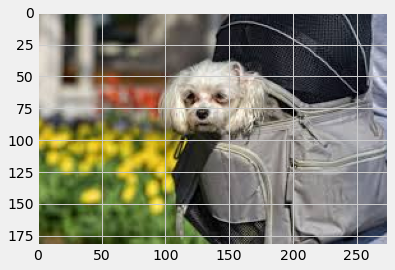

In [3]:
plt.imshow(img1)
plt.show()

In [4]:
img2 = cv2.imread("../input/image-processing/cool-symbol-hand-in-rock-sign-vector-27738350.jpg")
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)
img2.shape

(1080, 858, 3)

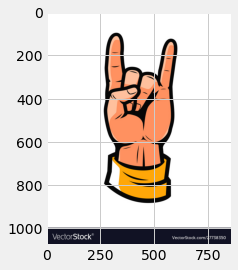

In [5]:
plt.imshow(img2)
plt.show()

### Resizing the image so that it can fit into other image

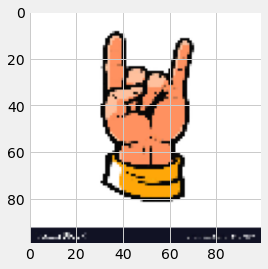

In [6]:
img2 = cv2.resize(img2,(100,100))
plt.imshow(img2)
plt.show()

###  Region of interest

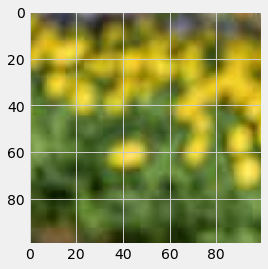

In [7]:
y_offset = img1.shape[0] - 100
x_offset = 0
roi = img1[y_offset:img1.shape[0],x_offset:100]
plt.imshow(roi)
plt.show()

### Converted the Pasting Image to Grayscale

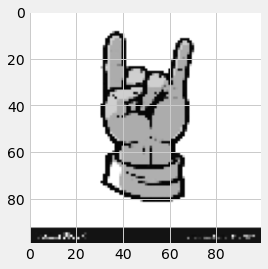

In [8]:
img2_gray = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)
plt.imshow(img2_gray,cmap = 'gray') 
# we have to map above image to gray while displaying otherwise it would map to 
# some different color.
plt.show()
# Try it by removing cmap parameter from imshow().

### We will apply Bitwise Not Operator

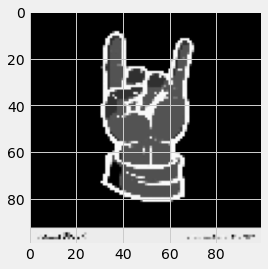

In [9]:
mask_inv = cv2.bitwise_not(img2_gray)
plt.imshow(mask_inv,cmap = "gray")
plt.show()

## Mask the Region to be Cut-Off

Shape is (100, 100, 3)


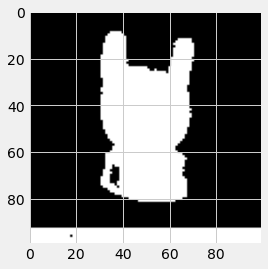

In [10]:
white_bg = np.full(img2.shape,255,dtype = np.uint8)
white_bg.shape
bg = cv2.bitwise_or(white_bg,white_bg,mask = mask_inv)
print(f"Shape is {bg.shape}")
plt.imshow(bg)
plt.show()

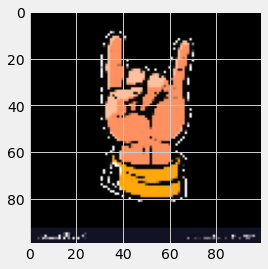

In [11]:
# foreground 

fg = cv2.bitwise_or(img2,img2,mask = mask_inv)
plt.imshow(fg)
plt.show()

### Final Blending of Image and Change the Image intensity in Actual Image.

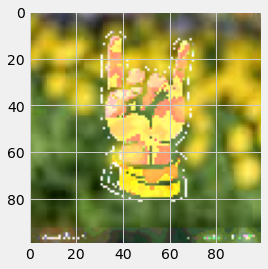

In [12]:
final_roi = cv2.bitwise_or(roi,fg)
plt.imshow(final_roi)
plt.show()

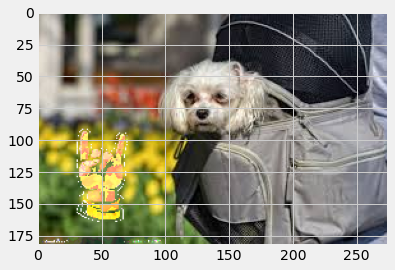

In [13]:
img1[y_offset:img1.shape[0],x_offset:100] = final_roi
plt.imshow(img1)
plt.show()

## Image Thresholding

In [14]:
def show_img(img):
    fig = plt.figure(figsize = (15,15))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap = 'gray')

Shape of image is (1400, 1400)


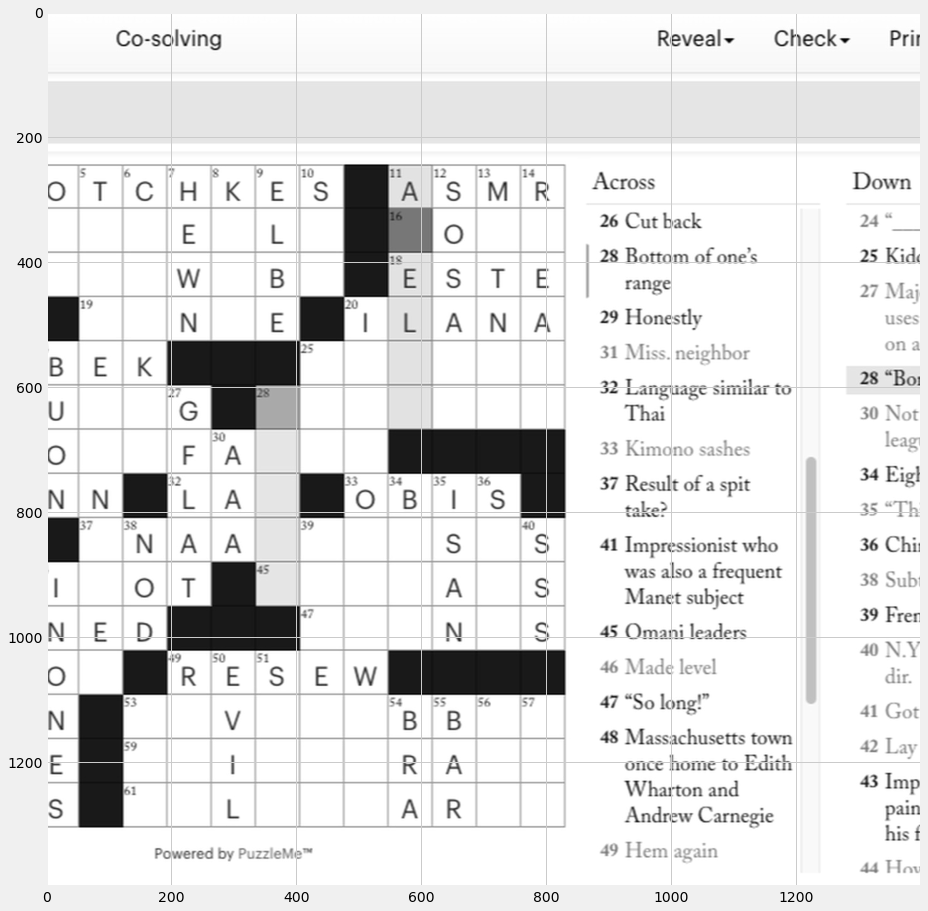

In [15]:
img = cv2.imread("../input/image-processing/NYer_crossword_puzzle.jpg",0)
print(f"Shape of image is {img.shape}")
show_img(img)

### Results of different kind of thresholding

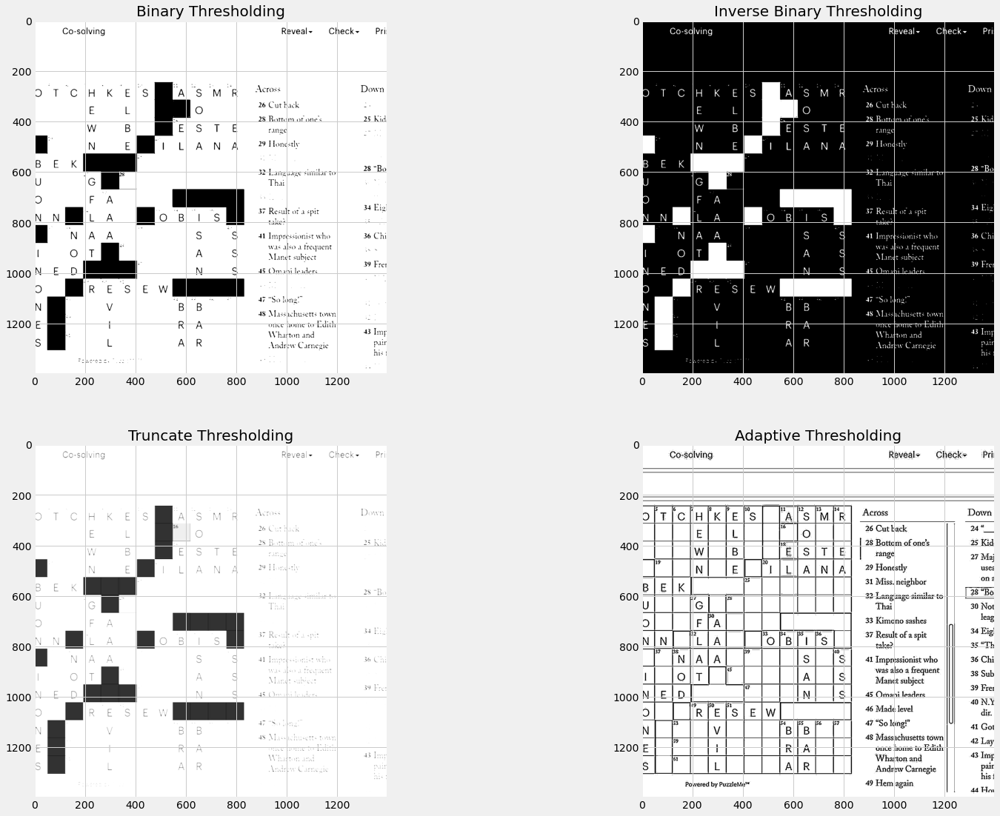

In [16]:
# binary thresholding
fig = plt.figure(figsize = (24,18))
ax1 = fig.add_subplot(221)
ret, th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
ax1.imshow(th1,cmap = "gray")
ax1.set_title("Binary Thresholding",fontdict={'fontsize':20})

ax2 = fig.add_subplot(222)
ret, th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
ax2.imshow(th1,cmap = "gray")
ax2.set_title("Inverse Binary Thresholding",fontdict={'fontsize':20})

ax3 = fig.add_subplot(223)
ret, th1 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
ax3.imshow(th1,cmap = "gray",)
ax3.set_title("Truncate Thresholding",fontdict={'fontsize':20})

ax4 = fig.add_subplot(224)
th1 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,9,3)
ax4.imshow(th1,cmap = "gray")
ax4.set_title("Adaptive Thresholding",fontdict={'fontsize':20})

plt.show()

## Blurring and Smoothing

In [17]:
def load_img(path,color_code = 1):
    img = cv2.imread(path,color_code).astype(np.float32)/255
    if color_code != 0:
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return(img)
def display_img(img):
    fig = plt.figure(figsize = (12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap = 'gray')

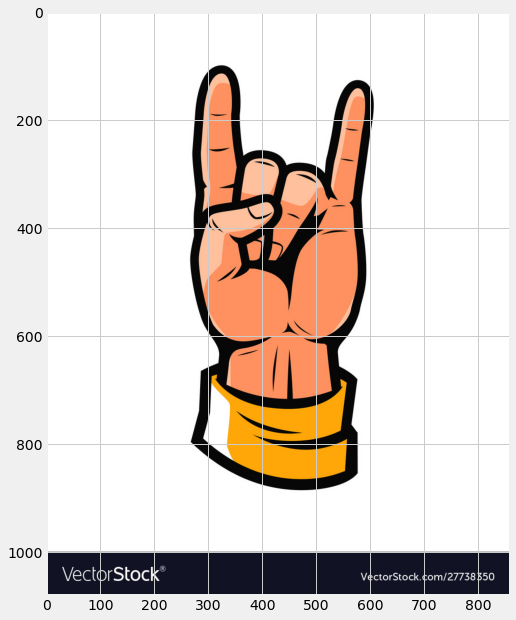

In [18]:
img = load_img("../input/image-processing/cool-symbol-hand-in-rock-sign-vector-27738350.jpg",1)
display_img(img)

### Use of Gamma Parameter

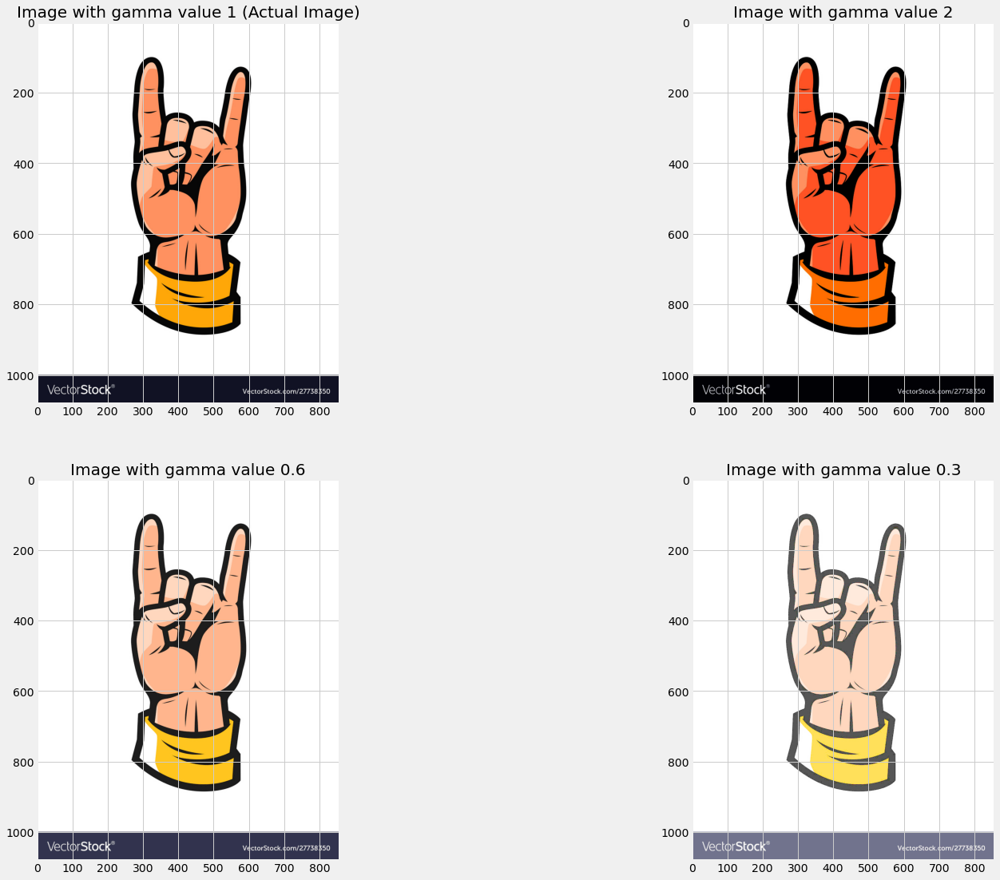

In [19]:
# now we are going to apply gamma filter which sharpen and blur the image 
# if gamma value > 1 => Image will get darker
# if gamma value = 1 => Image stays the same
# if gamma value < 1 => Image will get more sharpen

fig = plt.figure(figsize = (24,18))
ax1 = fig.add_subplot(221)
gamma1 = 1 # float(input("Input the value of gamma to be applied on image 1 ")) 
result = np.power(img,gamma1)
ax1.imshow(result,cmap = 'gray')
ax1.set_title(f"Image with gamma value {gamma1} (Actual Image)",fontdict={'fontsize':20})

ax2 = fig.add_subplot(222)
gamma2 = 2 # float(input("Input the value of gamma to be applied on image 2 ")) 
result = np.power(img,gamma2)
ax2.imshow(result,cmap = 'gray')
ax2.set_title(f"Image with gamma value {gamma2}",fontdict={'fontsize':20})

ax3 = fig.add_subplot(223)
gamma3 = 0.6 # float(input("Input the value of gamma to be applied on image 3 ")) 
result = np.power(img,gamma3)
ax3.imshow(result,cmap = 'gray')
ax3.set_title(f"Image with gamma value {gamma3}",fontdict={'fontsize':20})


ax4 = fig.add_subplot(224)
gamma4 = 0.3 #float(input("Input the value of gamma to be applied on image 4 ")) 
result = np.power(img,gamma4)
ax4.imshow(result,cmap = 'gray')
ax4.set_title(f"Image with gamma value {gamma4}",fontdict={'fontsize':20})

plt.show()

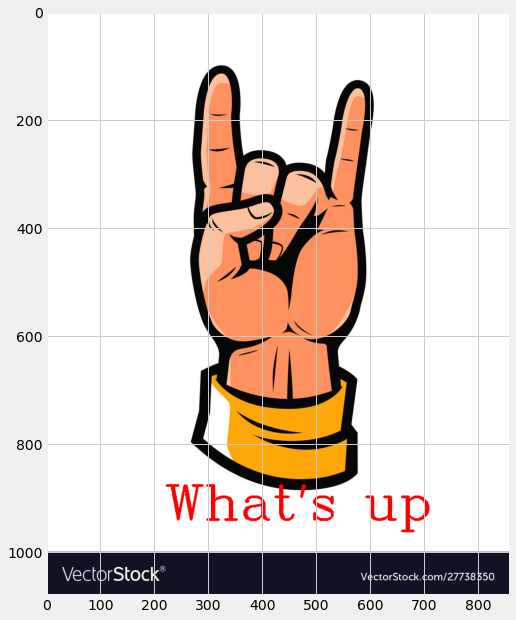

In [20]:
img = load_img("../input/image-processing/cool-symbol-hand-in-rock-sign-vector-27738350.jpg",1)
font = cv2.FONT_HERSHEY_COMPLEX
display_img(cv2.putText(img, text = "What's up",org = (220,940),fontFace = font,fontScale = 3,color = (255,0,0),thickness = 3))

### Use of Kernel for Filtering 

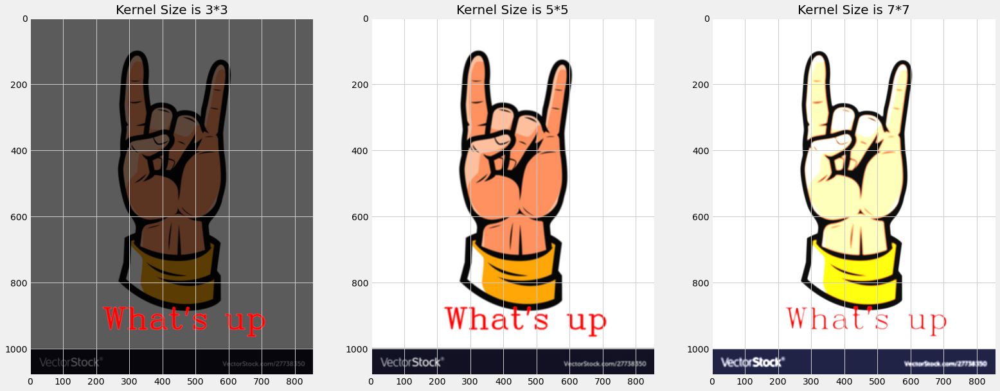

In [21]:
# by changing kernel size and weights within will have great impact and the end result will also changes 

fig = plt.figure(figsize = (24,18))
ax = fig.add_subplot(131)
kernel = np.ones(shape = (3,3),dtype = np.float32)/25
new_img = cv2.filter2D(img,-1,kernel)
ax.imshow(new_img,cmap = "gray")
ax.set_title("Kernel Size is 3*3", fontdict={"fontsize":20})

ax = fig.add_subplot(132)
kernel = np.ones(shape = (5,5),dtype = np.float32)/25
new_img = cv2.filter2D(img,-1,kernel)
ax.imshow(new_img,cmap = "gray")
ax.set_title("Kernel Size is 5*5", fontdict={"fontsize":20})

ax = fig.add_subplot(133)
kernel = np.ones(shape = (7,7),dtype = np.float32)/25
new_img = cv2.filter2D(img,-1,kernel)
ax.imshow(new_img,cmap = "gray")
ax.set_title("Kernel Size is 7*7", fontdict={"fontsize":20})
plt.show()

### Now let's try to remove Noise from the Image( both grayscale and color)

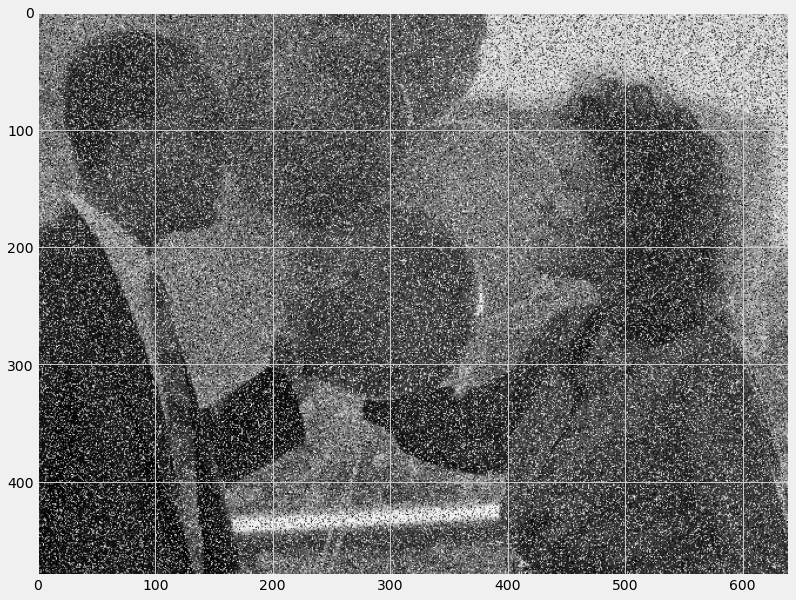

In [22]:
noise_img = load_img("../input/cv-object-detecton-dataset/CV Object Detecton Dataset/balloons_noisy.png",0)
display_img(noise_img)

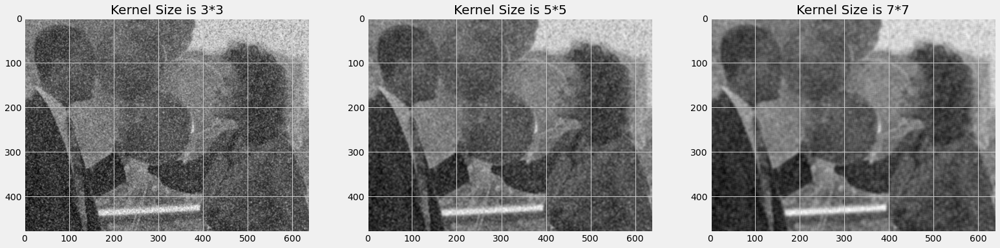

In [23]:
# let's apply same kernel technique to reduce noise in the image 

fig = plt.figure(figsize = (24,18))
ax = fig.add_subplot(131)
kernel = np.ones(shape = (3,3),dtype = np.float32)/9
new_img = cv2.filter2D(noise_img,-1,kernel)
ax.imshow(new_img,cmap = "gray")
ax.set_title("Kernel Size is 3*3", fontdict={"fontsize":20})

ax = fig.add_subplot(132)
kernel = np.ones(shape = (5,5),dtype = np.float32)/9
new_img = cv2.filter2D(noise_img,-1,kernel)
ax.imshow(new_img,cmap = "gray")
ax.set_title("Kernel Size is 5*5", fontdict={"fontsize":20})

ax = fig.add_subplot(133)
kernel = np.ones(shape = (7,7),dtype = np.float32)/9
new_img = cv2.filter2D(noise_img,-1,kernel)
ax.imshow(new_img,cmap = "gray")
ax.set_title("Kernel Size is 7*7", fontdict={"fontsize":20})
plt.show()

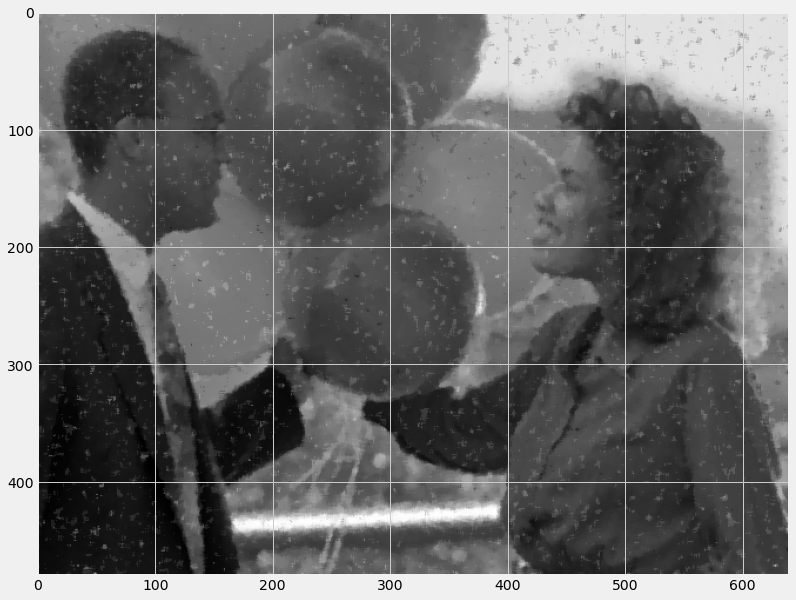

In [24]:
median_res = cv2.medianBlur(noise_img,5)
display_img(median_res)
# as you can see the below result noise has been removed from image to a great extent.

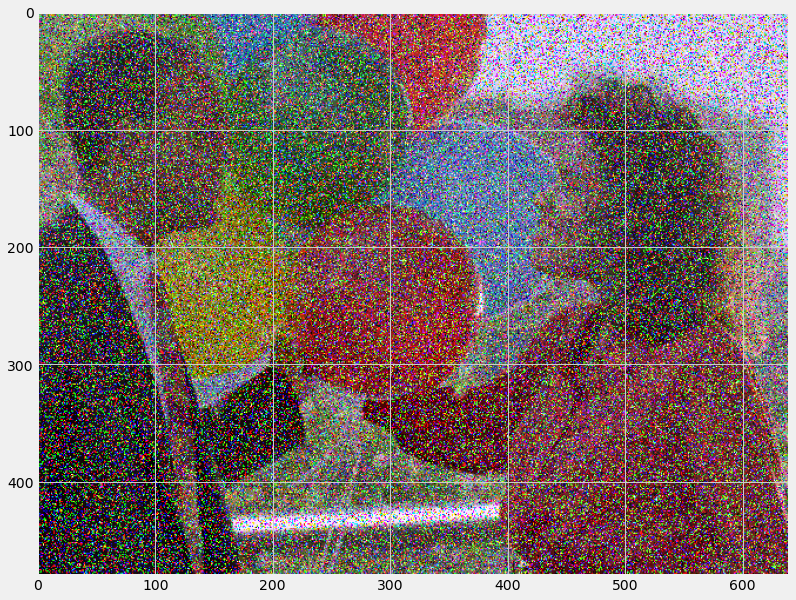

In [25]:
noise_img = load_img("../input/cv-object-detecton-dataset/CV Object Detecton Dataset/balloons_noisy.png",1)
display_img(noise_img)

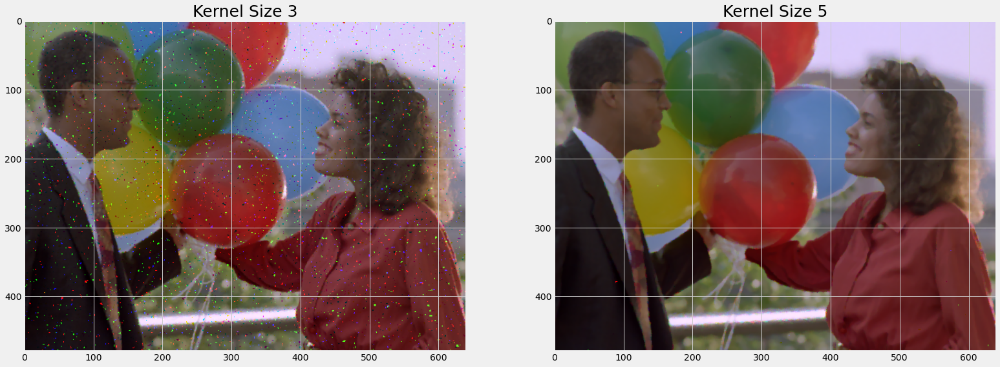

In [26]:
# let's check how our kernel method and median blurring techniques works on color image 
fig = plt.figure(figsize = (24,18))
ax = fig.add_subplot(121)
median_res = cv2.medianBlur(noise_img,3)
ax.imshow(median_res)
ax.set_title("Kernel Size 3",fontdict = {'fontsize':25})

ax = fig.add_subplot(122)
median_res = cv2.medianBlur(noise_img,5)
ax.imshow(median_res)
ax.set_title("Kernel Size 5",fontdict = {'fontsize':25})
plt.show()

## Morphological Operators



*   Morphological Operators are sets of kernels that can achieve a variety of effect, such as reducing noise.
*   Certain operators are very good at reducing black points on a white background (and vice versa)


*   Today, I will show how certain operators achieve an erosion and dilation effect that can add or erode from an existing image.
*   This effect is most easily seen on text data, so we will practice various morphological operators on some text data.

*   These operators are not very useful on images, feel free to try on above noisy images.






In [27]:
def load_text_img():
    blank_img = np.zeros((900,900)) # black blank image
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(
      blank_img,text = "Denoising",
      org = (100,350),fontFace = font,fontScale = 5,
      color = (255,255,255), # white color
      thickness = 20
              )

    cv2.putText(
      blank_img,text = "Image",
      org = (200,550),fontFace = font,fontScale = 5,
      color = (255,255,255), # white color
      thickness = 20
              )
    return(blank_img)

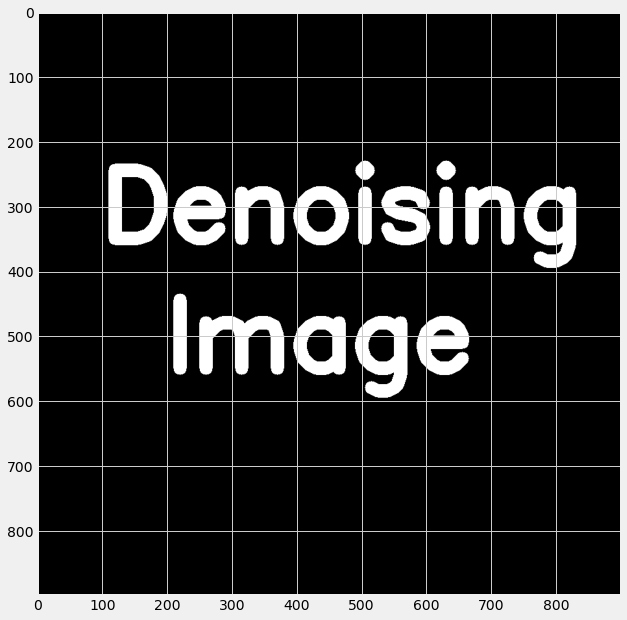

In [28]:
text_img = load_text_img()
display_img(text_img)

## Erode Operation

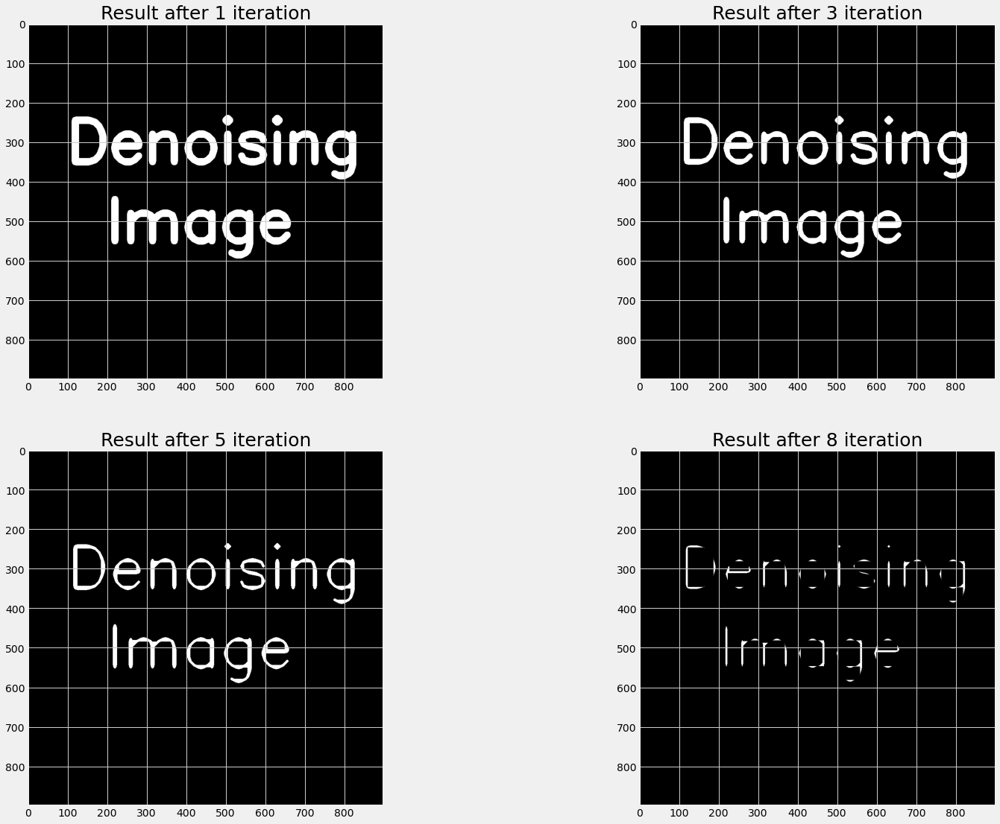

In [29]:
fig = plt.figure(figsize = (24,18))
ax = fig.add_subplot(2,2,1)
kernel = np.ones((3,3),dtype = np.uint8)
ax.imshow(cv2.erode(text_img,kernel,iterations = 1),cmap = 'gray')
ax.set_title("Result after 1 iteration",fontdict = {"fontsize":25})

ax = fig.add_subplot(2,2,2)
ax.imshow(cv2.erode(text_img,kernel,iterations = 3),cmap = 'gray')
ax.set_title("Result after 3 iteration",fontdict = {"fontsize":25})

ax = fig.add_subplot(2,2,3)
ax.imshow(cv2.erode(text_img,kernel,iterations = 5),cmap = 'gray')
ax.set_title("Result after 5 iteration",fontdict = {"fontsize":25})

ax = fig.add_subplot(2,2,4)
ax.imshow(cv2.erode(text_img,kernel,iterations = 8),cmap = 'gray')
ax.set_title("Result after 8 iteration",fontdict = {"fontsize":25})


plt.show()



*   As we can see from above result what cv2.erode function do, it ry to erodes away the boundaries of foreground object. 
*   A pixel in the original image will be considered 1 only if all pixels under the kernel is 1, otherwise it is eroded to zero.


*   So, we can imply as kernel size increases the result will get eroded in less iterations or faster than smaller kernels.





## Dilation Operation

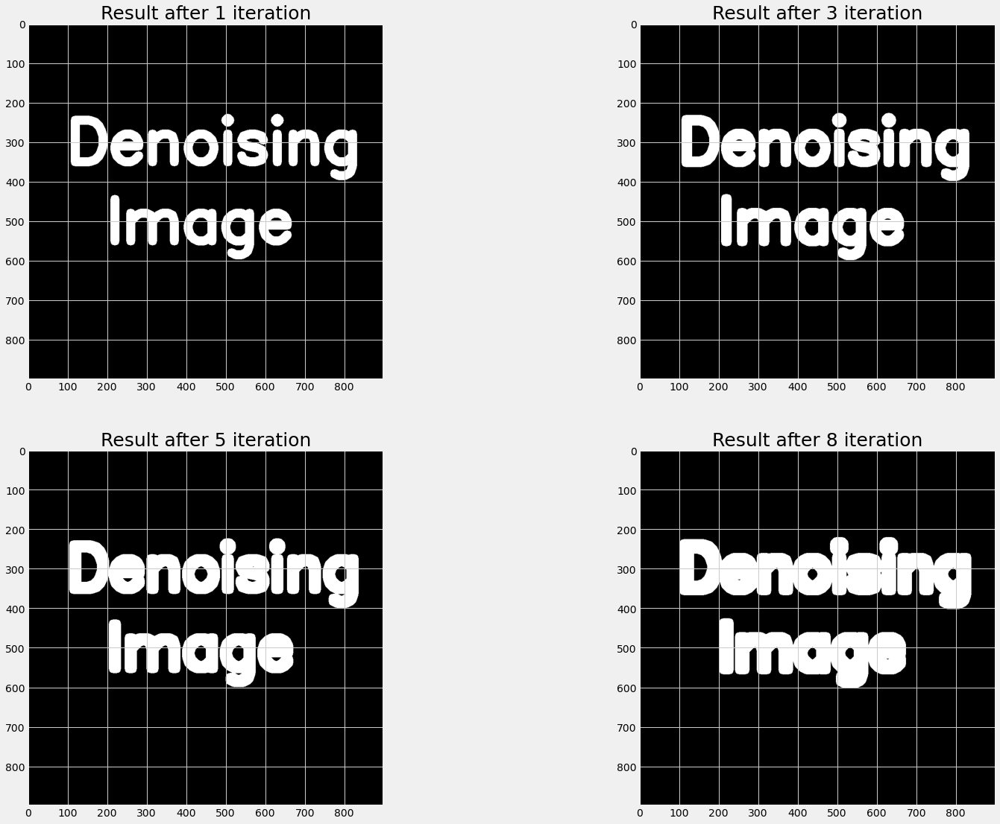

In [30]:
fig = plt.figure(figsize = (24,18))
ax = fig.add_subplot(2,2,1)
kernel = np.ones((3,3),dtype = np.uint8)
ax.imshow(cv2.dilate(text_img,kernel,iterations = 1),cmap = 'gray')
ax.set_title("Result after 1 iteration",fontdict = {"fontsize":25})

ax = fig.add_subplot(2,2,2)
ax.imshow(cv2.dilate(text_img,kernel,iterations = 3),cmap = 'gray')
ax.set_title("Result after 3 iteration",fontdict = {"fontsize":25})

ax = fig.add_subplot(2,2,3)
ax.imshow(cv2.dilate(text_img,kernel,iterations = 5),cmap = 'gray')
ax.set_title("Result after 5 iteration",fontdict = {"fontsize":25})

ax = fig.add_subplot(2,2,4)
ax.imshow(cv2.dilate(text_img,kernel,iterations = 8),cmap = 'gray')
ax.set_title("Result after 8 iteration",fontdict = {"fontsize":25})

plt.show()

*   As we can see from above result what cv2.dilate function do, it try to add or expand away the boundaries of foreground object. 
*   A pixel in the original image will be considered 1 if atleast one pixels under the kernel is 1, otherwise it is eroded to zero.



*   It increases the white region in the image or size of foreground object increases


*   So, we can imply as kernel size increases the result will get dilated in less iterations or faster than smaller kernels.

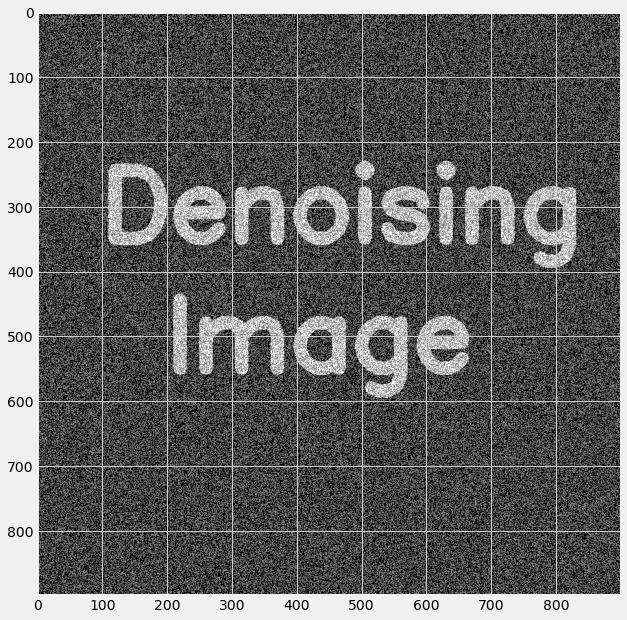

In [31]:
# now let's add some random noise to the image

white_noise = np.random.randint(low = 0,high=2,size = (900,900))
text_img_noise = text_img + white_noise*(255)
display_img(text_img_noise)

# although in real world these text is not this much visible also, but for tutorial purpose we are going with this
# these are background noise

## Opening Operation 



*   Opening is erosion operation followed by dilation operation
*   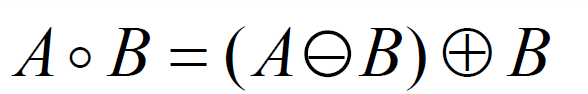





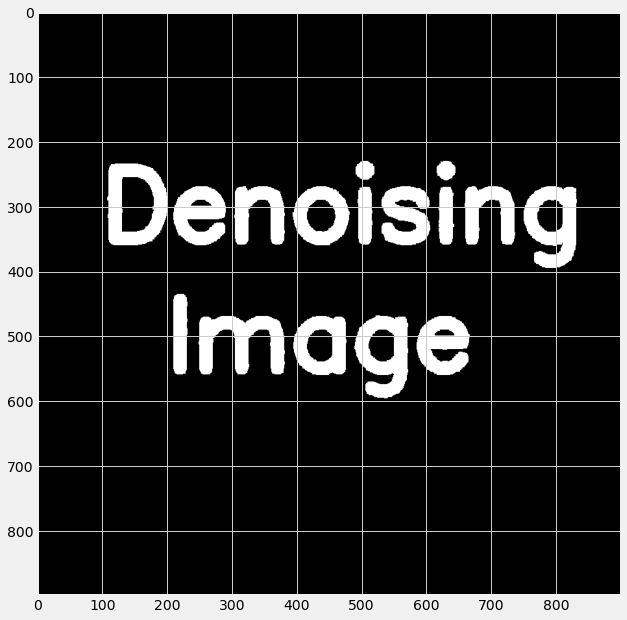

In [32]:
kernel = np.ones((5,5),dtype = np.uint8)
opening = cv2.morphologyEx(text_img_noise,cv2.MORPH_OPEN,kernel)
display_img(opening)

## Closing Operation


*   Closing is dilation operation followed by erosion operation
*   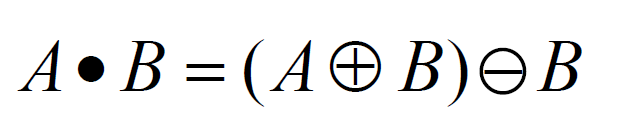



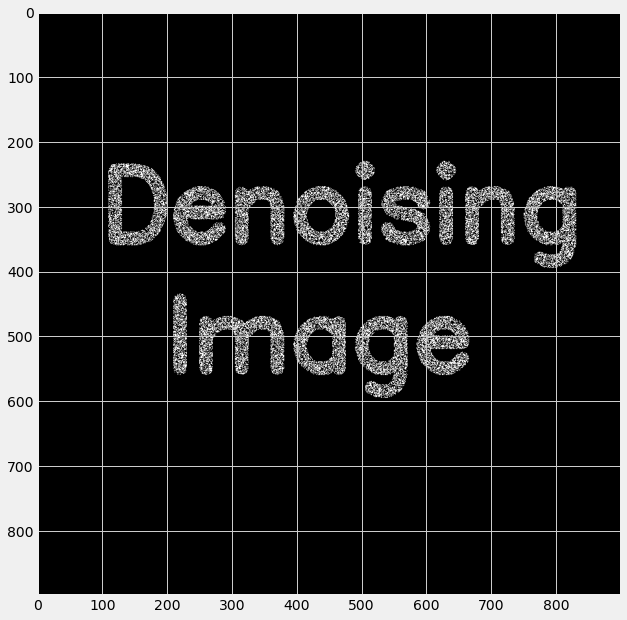

In [33]:
black_noise = np.random.randint(low = 0, high = 2,size = (900,900))
black_noise *=-255
text_img_noise = text_img + black_noise
text_img_noise[text_img_noise==-255] = 0
display_img(text_img_noise)

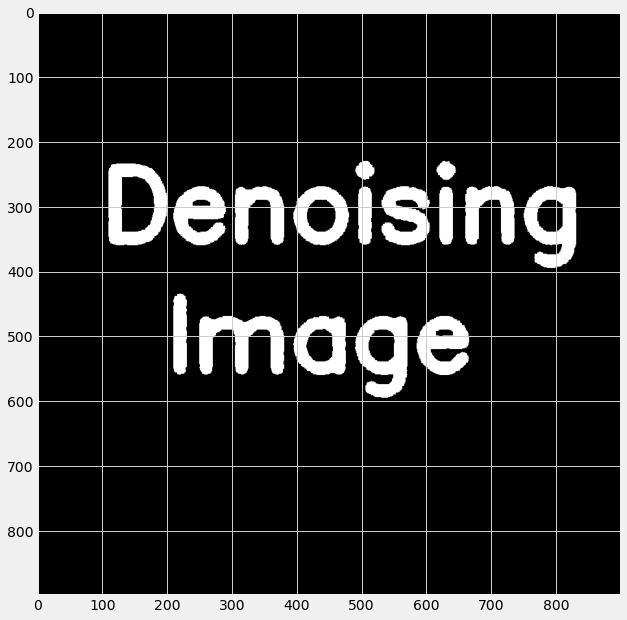

In [34]:
kernel = np.ones((5,5),dtype = np.uint8)
closing = cv2.morphologyEx(text_img_noise,cv2.MORPH_CLOSE,kernel)
display_img(closing)

## Gradient Operation


*   It is used for generating the outline of the image.


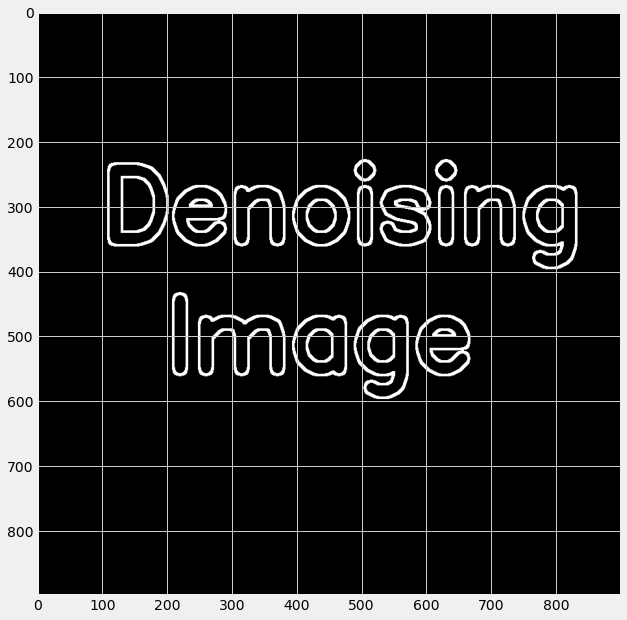

In [35]:
kernel = np.ones((5,5),dtype = np.uint8)
gradient = cv2.morphologyEx(text_img,cv2.MORPH_GRADIENT,kernel)
display_img(gradient)

## Image Gradient

An Image Gradient is a directional change in the intensity or color in an image.

shape of image is (1400, 1400)


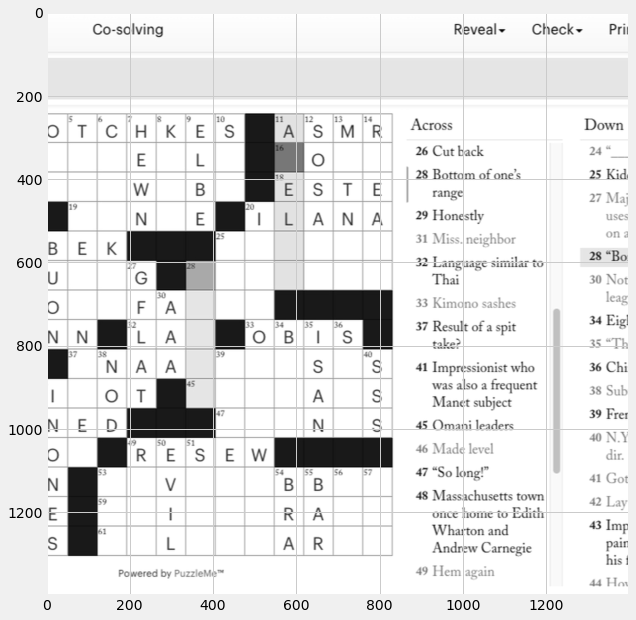

In [36]:
img = load_img("../input/image-processing/NYer_crossword_puzzle.jpg",color_code = 0)
display_img(img)
print(f"shape of image is {img.shape}")

## Sobel Operator

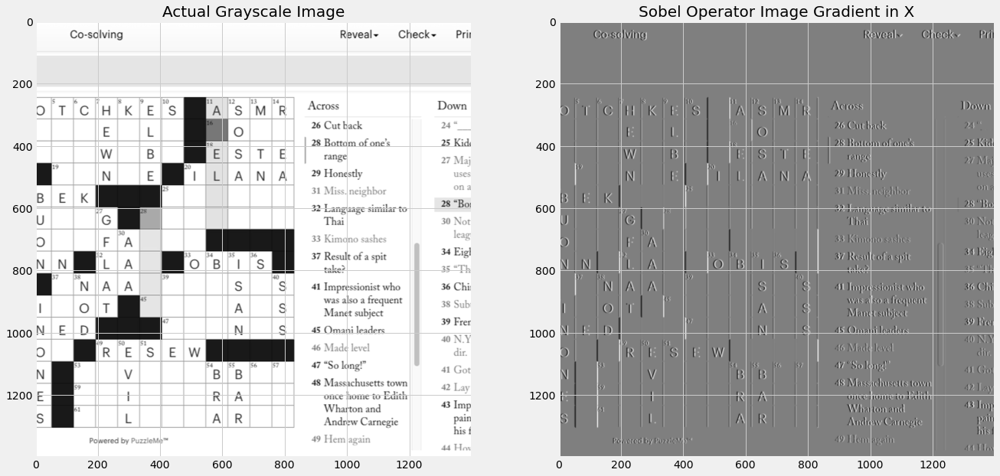

In [37]:
fig = plt.figure(figsize = (20,16))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(load_img("../input/image-processing/NYer_crossword_puzzle.jpg",color_code = 0),cmap = 'gray')
ax1.set_title("Actual Grayscale Image",fontdict = {'fontsize':20})

ax2 = fig.add_subplot(1,2,2)
ax2.imshow(cv2.Sobel(img, ddepth = cv2.CV_64F,dx = 1,dy = 0,ksize = 3),cmap = 'gray')
ax2.set_title("Sobel Operator Image Gradient in X",fontdict = {'fontsize':20})

plt.show()
# we calculated the derivative of image w.r.t x and normalizes it that's why horizontal line is
# barely visible

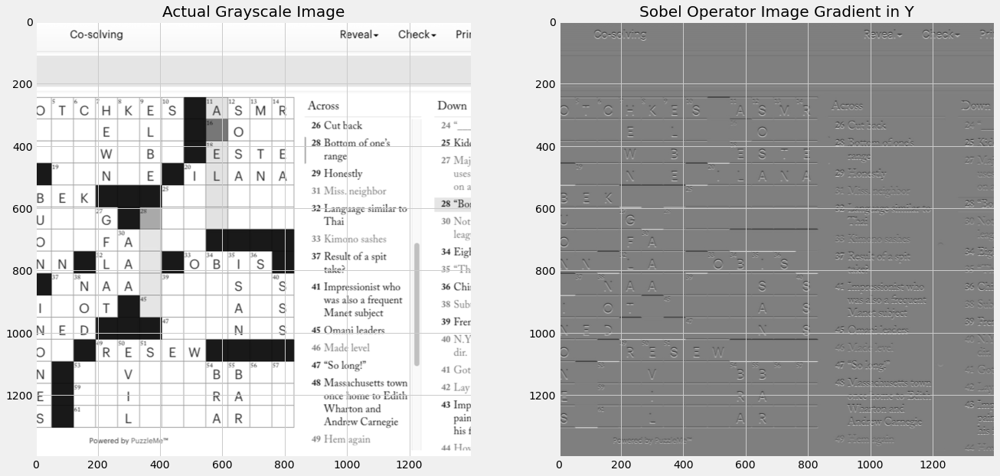

In [38]:
fig = plt.figure(figsize = (20,16))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(load_img("../input/image-processing/NYer_crossword_puzzle.jpg",color_code = 0),cmap = 'gray')
ax1.set_title("Actual Grayscale Image",fontdict = {'fontsize':20})

ax2 = fig.add_subplot(1,2,2)
ax2.imshow(cv2.Sobel(img, ddepth = cv2.CV_64F,dx = 0,dy = 1,ksize = 3),cmap = 'gray')
ax2.set_title("Sobel Operator Image Gradient in Y",fontdict = {'fontsize':20})

plt.show()
# we calculated the derivative of image w.r.t y and normalizes it that's why vertical line is
# barely visible

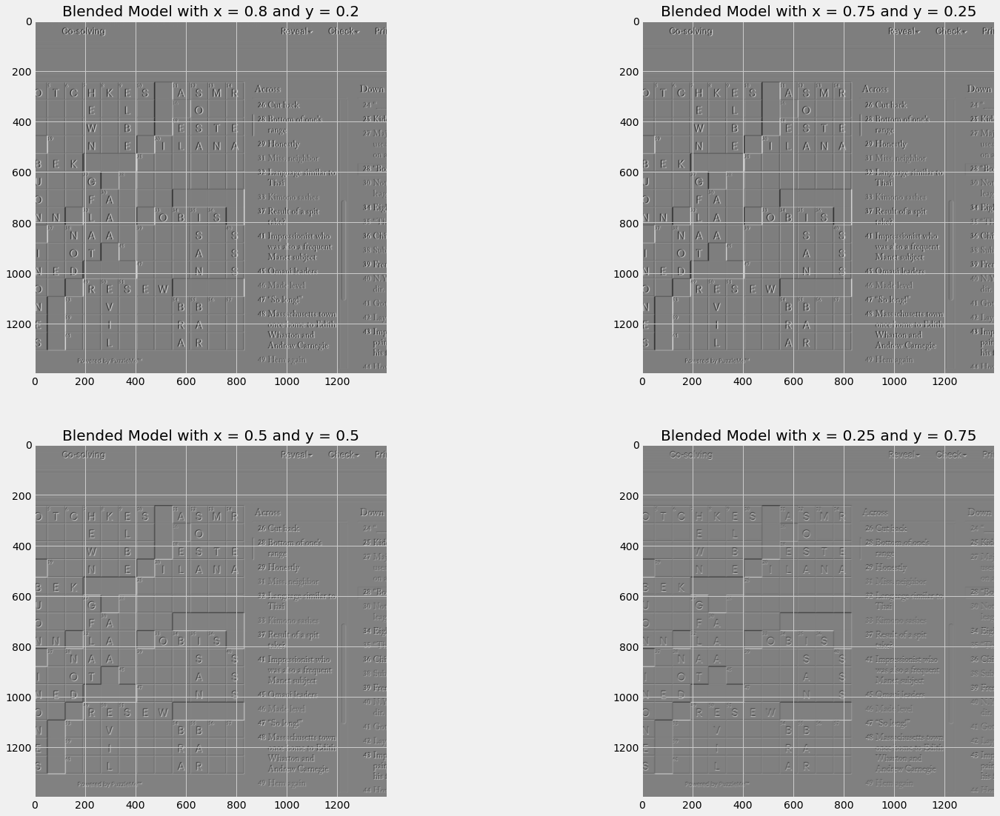

In [39]:
# lets blend both image opearated on sobel opeartor on x and y direction
fig = plt.figure(figsize=(24,18))
sobelx = cv2.Sobel(img,cv2.CV_64F,dx = 1,dy = 0,ksize = 3)
sobely = cv2.Sobel(img,cv2.CV_64F,dx = 0,dy = 1,ksize = 3)

# blended_img = cv2.addWeighted(src1 = sobelx,alpha = 0.75,src2 = sobely,beta = 0.25,gamma = 0)
# display_img(blended_img)

ax2 = fig.add_subplot(2,2,1)
ax2.imshow(cv2.addWeighted(src1 = sobelx,alpha = 0.80,src2 = sobely,beta = 0.20,gamma = 0),cmap = 'gray')
ax2.set_title("Blended Model with x = 0.8 and y = 0.2",fontdict = {'fontsize':20})


ax2 = fig.add_subplot(2,2,2)
ax2.imshow(cv2.addWeighted(src1 = sobelx,alpha = 0.75,src2 = sobely,beta = 0.25,gamma = 0),cmap = 'gray')
ax2.set_title("Blended Model with x = 0.75 and y = 0.25",fontdict = {'fontsize':20})



ax2 = fig.add_subplot(2,2,3)
ax2.imshow(cv2.addWeighted(src1 = sobelx,alpha = 0.5,src2 = sobely,beta = 0.5,gamma = 0),cmap = 'gray')
ax2.set_title("Blended Model with x = 0.5 and y = 0.5",fontdict = {'fontsize':20})



ax2 = fig.add_subplot(2,2,4)
ax2.imshow(cv2.addWeighted(src1 = sobelx,alpha = 0.25,src2 = sobely,beta = 0.75,gamma = 0),cmap = 'gray')
ax2.set_title("Blended Model with x = 0.25 and y = 0.75",fontdict = {'fontsize':20})

plt.show()



## Laplacian Operator 


*    Laplacian Operator calculate double derivative in both direction and add them
*   You will see that after applying Laplacian Oeprator it removed noises from the image and make the edges less visble but it has capture all detailed edges perfectly(if you see it carefully).



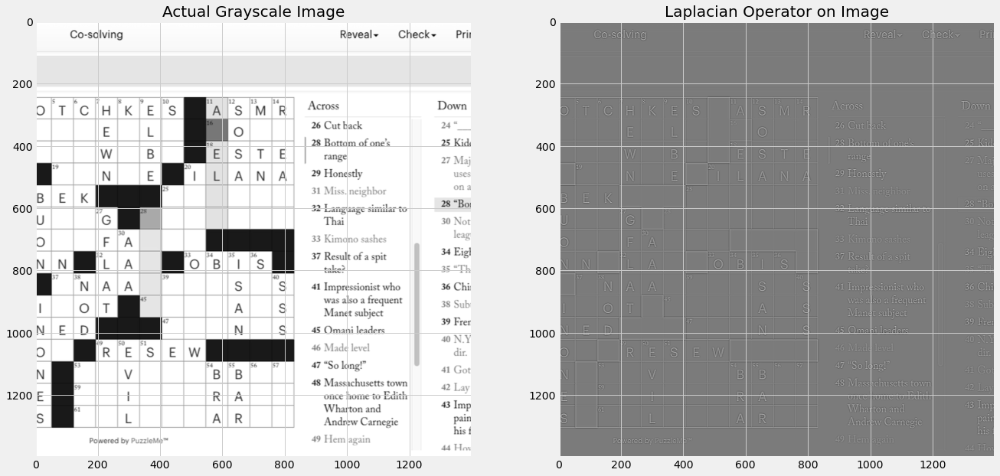

In [40]:
fig = plt.figure(figsize = (20,16))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(load_img("../input/image-processing/NYer_crossword_puzzle.jpg",color_code = 0),cmap = 'gray')
ax1.set_title("Actual Grayscale Image",fontdict = {'fontsize':20})

ax2 = fig.add_subplot(1,2,2)
ax2.imshow(cv2.Laplacian(img,cv2.CV_32F),cmap = 'gray')
ax2.set_title("Laplacian Operator on Image",fontdict = {'fontsize':20})

plt.show()



### In below code snippet I will show the result of sobel operator on Adaptive Threshold Image

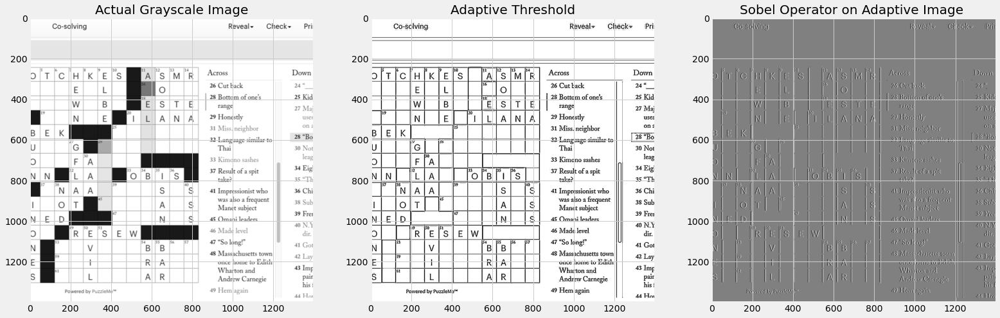

In [41]:
fig = plt.figure(figsize = (24,20))
ax1 = fig.add_subplot(1,3,1)
ax1.imshow(load_img("../input/image-processing/NYer_crossword_puzzle.jpg",color_code = 0),cmap = 'gray')
ax1.set_title("Actual Grayscale Image",fontdict = {'fontsize':20})

ax1 = fig.add_subplot(1,3,2)
src = cv2.imread("../input/image-processing/NYer_crossword_puzzle.jpg", cv2.CV_8UC1);
th1 = cv2.adaptiveThreshold(src,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,9,3)
ax1.imshow(th1,cmap = 'gray')
ax1.set_title("Adaptive Threshold",fontdict = {'fontsize':20})

ax2 = fig.add_subplot(1,3,3)
ax2.imshow(cv2.Sobel(th1, ddepth = cv2.CV_64F,dx = 1,dy = 0,ksize = 3),cmap = 'gray')
ax2.set_title("Sobel Operator on Adaptive Image ",fontdict = {'fontsize':20})

plt.show()
# we calculated the derivative of image w.r.t x and normalizes it that's why horizontal line is
# barely visible

## Image Histograms

An image histogram gives us the basic insight of what pixel value is largely present in the images. It's a graphical representation of pixel distribution in the image. It's also useful for having look whether an image is widely distributed or present in specific region. 

You will understand this when we will discuss Histogram Equalization Process.

In [42]:
dog_backpack = cv2.imread("../input/image-processing/images.jpg")
show_dog = cv2.cvtColor(dog_backpack,cv2.COLOR_BGR2RGB)

fall_image = cv2.imread("../input/image-processing/fall-1072821__340.jpg")
show_fall = cv2.cvtColor(fall_image, cv2.COLOR_BGR2RGB)

colorful_image = cv2.imread("../input/image-processing/download.jpg")
show_color = cv2.cvtColor(colorful_image, cv2.COLOR_BGR2RGB)

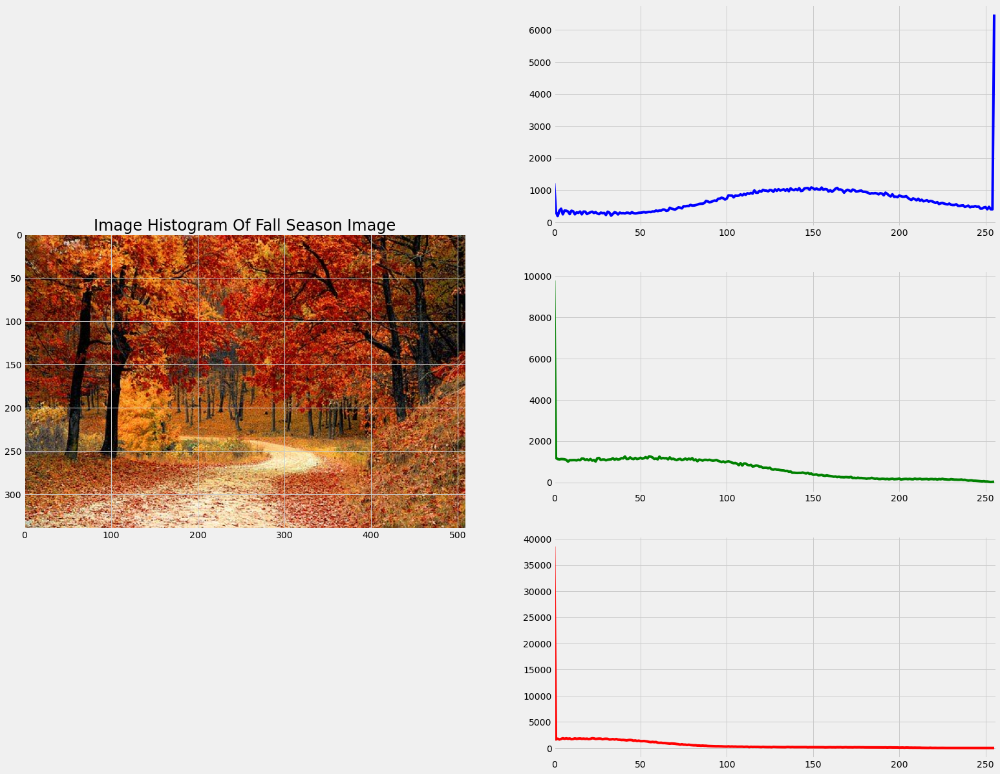

<Figure size 1728x1440 with 0 Axes>

In [43]:
fig = plt.figure(figsize = (24,20))
gs = GridSpec(3,2,figure = fig)

plt.figure(figsize = (24,20))
ax1 = fig.add_subplot(gs[:,0])
ax1.imshow(show_fall)
ax1.set_title("Fall Season Image",fontdict = {"fontsize":24,"color":'white'})

ax2 = fig.add_subplot(gs[0,1])
histr = cv2.calcHist([show_fall],[0],None,[256],[0,256])
ax2.plot(histr,color = 'b')
ax2.set_xlim(left = 0,right = 256)

ax3 = fig.add_subplot(gs[1,1])
histr = cv2.calcHist([show_fall],[1],None,[256],[0,256])
ax3.plot(histr,color = 'g')
ax3.set_xlim(left = 0,right = 256)

ax4 = fig.add_subplot(gs[2,1])
histr = cv2.calcHist([show_fall],[2],None,[256],[0,256])
ax4.plot(histr,color = 'r')
ax4.set_xlim(left = 0,right = 256)

ax1.set_title("Image Histogram Of Fall Season Image",fontdict = {"fontsize":24,"color":'black'})

plt.show()

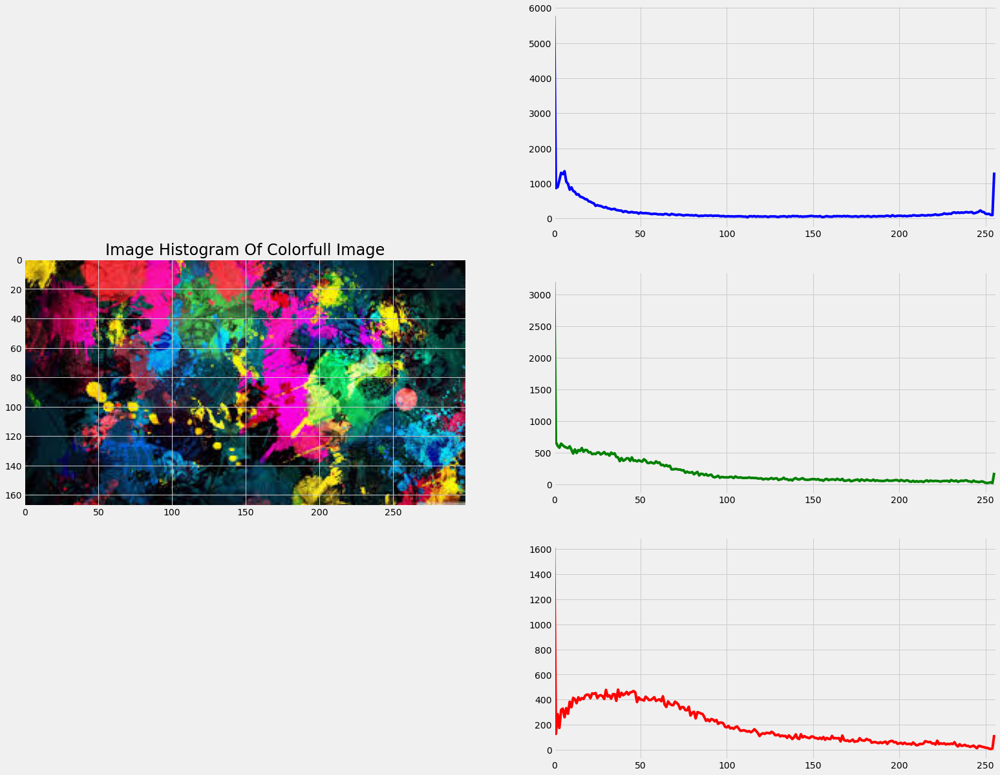

<Figure size 1728x1440 with 0 Axes>

In [44]:
fig = plt.figure(figsize = (24,20))
gs = GridSpec(3,2,figure = fig)

plt.figure(figsize = (24,20))
ax1 = fig.add_subplot(gs[:,0])
ax1.imshow(show_color)
ax1.set_title("Colorfull Image",fontdict = {"fontsize":24,"color":'white'})

ax2 = fig.add_subplot(gs[0,1])
histr = cv2.calcHist([show_color],[0],None,[256],[0,256])
ax2.plot(histr,color = 'b')
ax2.set_xlim(left = 0,right = 256)

ax3 = fig.add_subplot(gs[1,1])
histr = cv2.calcHist([show_color],[1],None,[256],[0,256])
ax3.plot(histr,color = 'g')
ax3.set_xlim(left = 0,right = 256)

ax4 = fig.add_subplot(gs[2,1])
histr = cv2.calcHist([show_color],[2],None,[256],[0,256])
ax4.plot(histr,color = 'r')
ax4.set_xlim(left = 0,right = 256)

ax1.set_title("Image Histogram Of Colorfull Image",fontdict = {"fontsize":24,"color":'black'})

plt.show()

## Now we will see the use of Mask

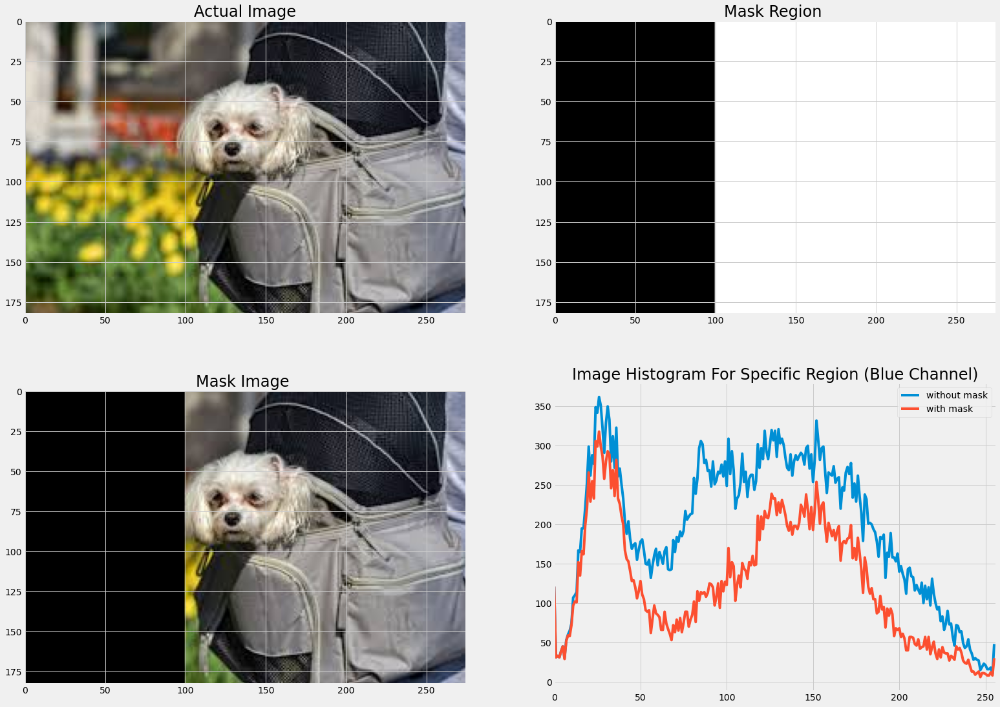

In [45]:
plt.figure(figsize = (24,18))
mask = np.zeros(show_dog.shape[:2], np.uint8)
mask[0:, 100:] = 255
masked_img = cv2.bitwise_and(show_dog,show_dog,mask = mask)

# Calculate histogram with mask and without mask
# Check third argument for mask
hist_full = cv2.calcHist([show_dog],[0],None,[256],[0,256])
hist_mask = cv2.calcHist([show_dog],[0],mask,[256],[0,256])

plt.subplot(221), 
plt.imshow(show_dog)
plt.title("Actual Image",fontdict={"fontsize":24 ,"color":"black" })
plt.subplot(222), 
plt.imshow(mask,cmap = "gray")
plt.title("Mask Region ",fontdict={"fontsize":24 ,"color":"black" })
plt.subplot(223), 
plt.imshow(masked_img,cmap = 'gray')
plt.title("Mask Image ",fontdict={"fontsize":24 ,"color":"black" })
plt.subplot(224), 
plt.plot(hist_full,label = "without mask")
plt.plot(hist_mask,label = "with mask")
plt.xlim([0,256])
plt.legend()
plt.title("Image Histogram For Specific Region (Blue Channel)",fontdict={"fontsize":24 ,"color":"black" })

plt.show()

## Equalize Histograms

Why Equalizing of Histograms is so important?? 

It is very important because as in Histogram Equalization Process, it increases the image contrast. What I mean by contrast is that the image variance is increased and pixel intensity range is stretched to available range of pixel intensity. By this, features can be easily segmented and classified.

It also diminishes mal effect of over saturation or exposure.As the illumination changes the statistical properties like mean and variance changes, so in order to compensate those changes we use histogram equalization.


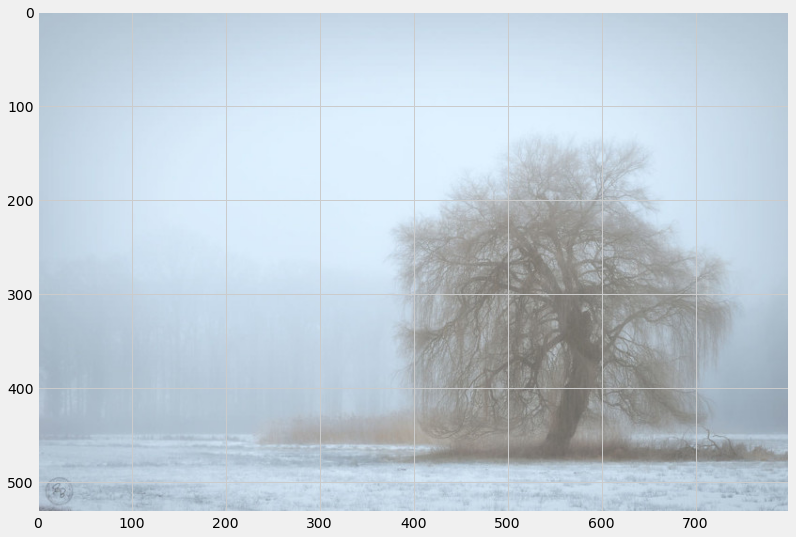

In [46]:
img = cv2.imread("../input/image-processing/p2219651326-5-800x533.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray_img = cv2.imread("../input/image-processing/p2219651326-5-800x533.jpg",0)
display_img(img)

### Let's see color content of this image.

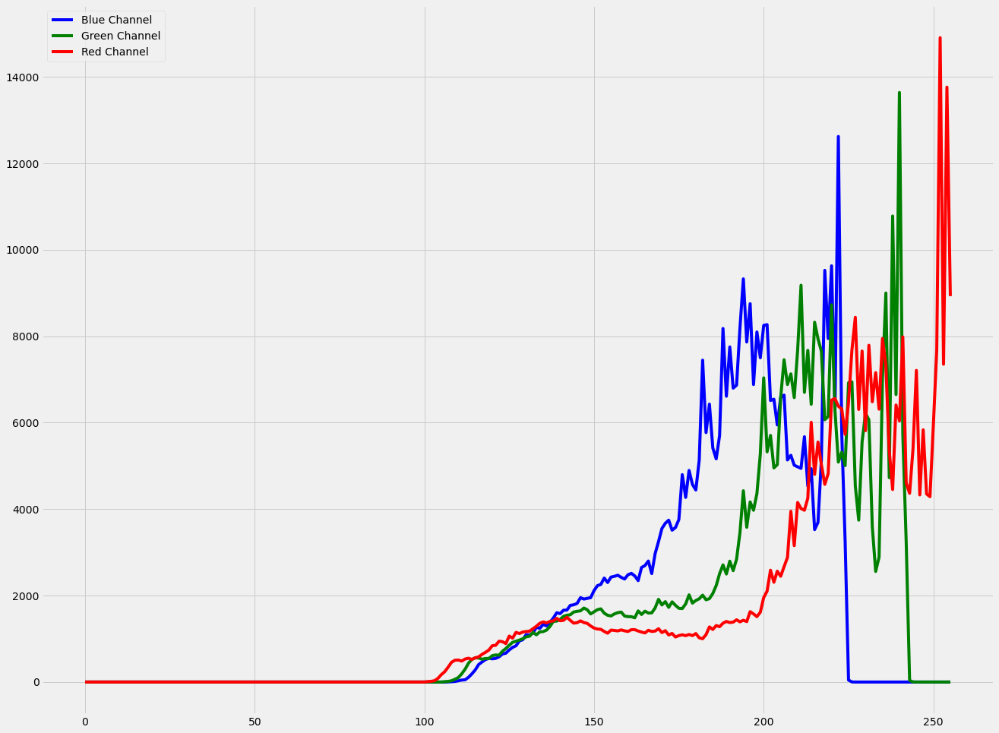

In [47]:

plt.figure(figsize = (20,16))
# blue region
hist_values = cv2.calcHist([img],channels = [0],mask = None, histSize = [256],ranges = [0,256])
plt.plot(hist_values,label = "Blue Channel",color = 'b')

# Green region
hist_values = cv2.calcHist([img],channels = [1],mask = None, histSize = [256],ranges = [0,256])
plt.plot(hist_values,label = "Green Channel",color = 'g')

# red region
hist_values = cv2.calcHist([img],channels = [2],mask = None, histSize = [256],ranges = [0,256])
plt.plot(hist_values,label = "Red Channel",color = 'r')
plt.legend()
plt.show()

### Now, we are going to apply equalizer to increase the brightness of an image.

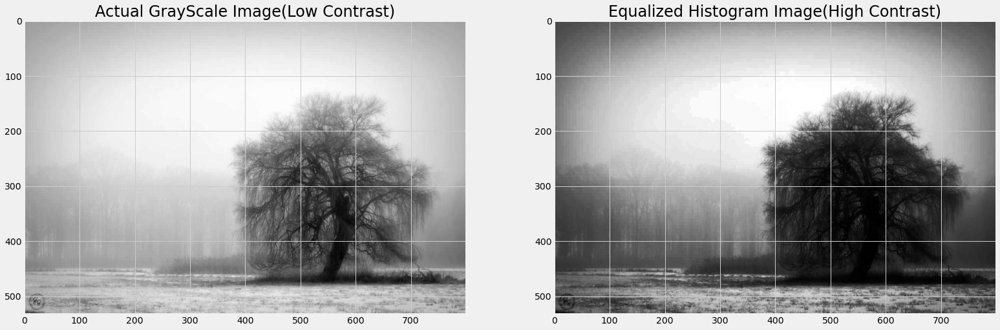

In [48]:
fig = plt.figure(figsize = (24,18))
ax = fig.add_subplot(1,2,1)
ax.imshow(gray_img,cmap = 'gray')
ax.set_title("Actual GrayScale Image(Low Contrast)",fontdict = {"fontsize":24,"color":"Black"})
ax = fig.add_subplot(1,2,2)
eq_img = cv2.equalizeHist(gray_img)
ax.imshow(eq_img,cmap = 'gray')
ax.set_title("Equalized Histogram Image(High Contrast)",fontdict = {"fontsize":24,"color":"Black"})

plt.show()

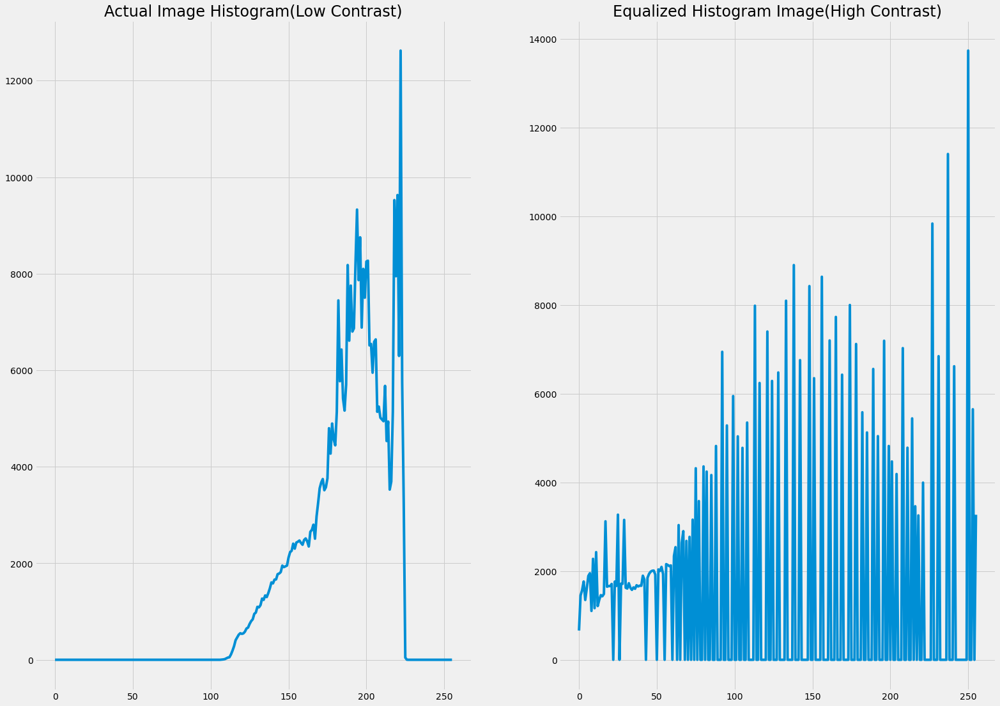

In [49]:
hist_values = cv2.calcHist([img],channels = [0],mask = None, histSize = [256],ranges = [0,256])
eq_hist_values = cv2.calcHist([eq_img],channels = [0],mask = None,histSize = [256],ranges = [0,256])
fig = plt.figure(figsize = (24,18))
ax = fig.add_subplot(1,2,1)
ax.plot(hist_values)
ax.set_title("Actual Image Histogram(Low Contrast)",fontdict = {"fontsize":24,"color":"Black"})
ax = fig.add_subplot(1,2,2)
eq_img = cv2.equalizeHist(gray_img)
ax.plot(eq_hist_values)
ax.set_title("Equalized Histogram Image(High Contrast)",fontdict = {"fontsize":24,"color":"Black"})

plt.show()

In [50]:
img = cv2.imread("../input/image-processing/p2219651326-5-800x533.jpg")
hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
# h -> Hue
# s -> Saturation
# v -> value or also called brightness 
# so here we will play with values of v

print(f"Min value of v(brightness) feature is {hsv[:,:,2].min()} and Max value of v(brighness) feature is \
{hsv[:,:,2].max()}")

Min value of v(brightness) feature is 107 and Max value of v(brighness) feature is 255


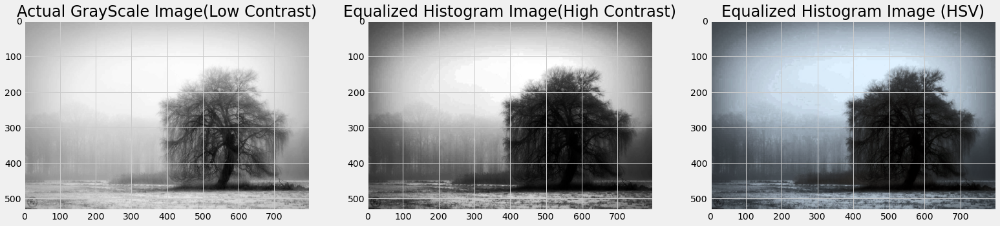

In [51]:
hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])
eq_color_img = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
fig = plt.figure(figsize = (24,20))
ax = fig.add_subplot(1,3,1)
ax.imshow(gray_img,cmap = 'gray')
ax.set_title("Actual GrayScale Image(Low Contrast)",fontdict = {"fontsize":24,"color":"Black"})

ax = fig.add_subplot(1,3,2)
eq_img = cv2.equalizeHist(gray_img)
ax.imshow(eq_img,cmap = 'gray')
ax.set_title("Equalized Histogram Image(High Contrast)",fontdict = {"fontsize":24,"color":"Black"})

ax = fig.add_subplot(1,3,3)
ax.imshow(eq_color_img,cmap = 'gray')
ax.set_title("Equalized Histogram Image (HSV)",fontdict = {"fontsize":24,"color":"Black"})
plt.show()

### So, This concludes my work. Thank you for reading it............ I hope you enjoyed it.......... pls do upvote....

### Also, stay tuned for my further content on Computer Vision.
